In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import jupyter_black

jupyter_black.load()

In [3]:
import numpy as np
from scipy.io.wavfile import read

from acoustics.impulse import convolve_display
from acoustics.plot import compare, compare_impulse_responses, plot
from acoustics.porous_absorbers import materials, porous_absorber
from acoustics.rew import rew_impulse_responses, rew_measurements, rew_rt60s

In [4]:
# Data pulled from decay-time
%store -r volume

In [5]:
sample_rate, sample_data = read("../sounds/satellite.wav")

In [6]:
directory = "data/2024-05-16_back_and_side"
measurements = rew_measurements(directory)
rt60s = rew_rt60s(directory)
impulse_responses = rew_impulse_responses(directory)

# load the untreated room impulse response for before/after listening down at the bottom
impulse_responses.update(rew_impulse_responses("data/2024-05-07_front"))

rate = next(iter(impulse_responses.values()))["rate"]

## Back & Side Treatments

3d model of the room with the treatments under test highlighted:

<img src="../images/back-and-side-model.png" width=500/>

There are 4 treatments total. Two 8" deep cells hung in the back half of the left wall, a large 12" panel placed on the back wall, and a slim 4" treatment hung on the back wall between two doors.

side's material sigma is 1850α
Its thickness is 0.203m leaving an air gap of 0.000m
Its modeled average absorption coefficent is 0.8276005604742601
Resulting in an average Sa of 0.6407217331146885 and predicted reduction of 11ms

back's material sigma is 1850α
Its thickness is 0.260m leaving an air gap of 0.044m
Its modeled average absorption coefficent is 0.9038376582654927
Resulting in an average Sa of 1.0606354152213904 and predicted reduction of 18ms

slim's material sigma is 20000α
Its thickness is 0.089m leaving an air gap of 0.012m
Its modeled average absorption coefficent is 0.7432363860772917
Resulting in an average Sa of 0.3159051935382921 and predicted reduction of 6ms



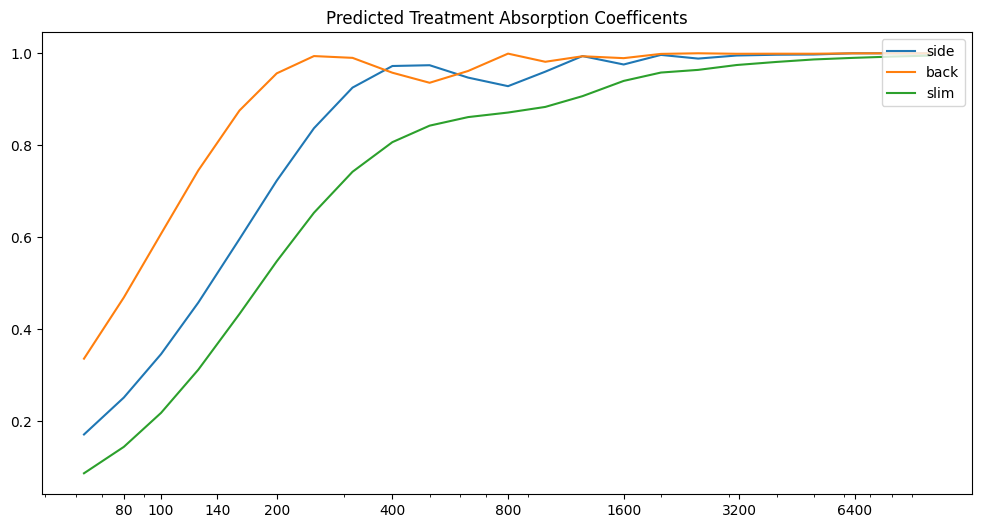

In [7]:
treatments = {
    "side": {
        "width": 0.762,
        "height": 1.016,
        "depth": 0.203,
        "material": "JM R-30",
    },
    "back": {
        "width": 0.889,
        "height": 1.320,
        "depth": 0.304,
        "material": "JM R-30",
    },
    "slim": {
        "width": 0.322,
        "height": 1.320,
        "depth": 0.101,
        "material": "OC Fire & Sound Plus R-15",
    },
}

f = rt60s["bns-before-p1-l"]["freq"]
existing_Tm = rt60s["bns-before-p1-l"]["topt"]
existing_Sa = 0.161 * volume / existing_Tm

for name, data in treatments.items():
    material = materials[data["material"]]
    print(f"{name}'s material sigma is {material['sigma']}α")
    thickness = material["thickness"]

    if thickness > data["depth"]:
        # material's spec'd size is larger than the space
        air_gap = 0
        thickness = data["depth"]
    else:
        air_gap = data["depth"] - thickness
    print(f"Its thickness is {thickness:.3f}m leaving an air gap of {air_gap:.3f}m")

    data["a"] = porous_absorber(
        f,
        sigma=material["sigma"],
        thickness=thickness,
        air_gap=air_gap,
    )
    print(f"Its modeled average absorption coefficent is {np.average(data['a'])}")
    data["Sa"] = data["a"] * (data["width"] * data["height"])
    new_Sa = existing_Sa + data["Sa"]
    new_Tm = 0.161 * volume / new_Sa
    data["dTm"] = (existing_Tm - new_Tm) * 1000.0
    print(
        f"Resulting in an average Sa of {np.average(data['Sa'])} and predicted reduction of {np.average(data['dTm']):.0f}ms"
    )
    print("")


ax = plot(
    f,
    {k: v["a"] for k, v in treatments.items()},
    title="Predicted Treatment Absorption Coefficents",
)

In [8]:
def compare_measurements(a, b, title):
    a_data = measurements[a]
    freq = a_data["freq"]
    skip = len(freq[freq <= 30])
    ax1, ax2 = compare(
        a_data["freq"][skip:],
        a,
        a_data["spl"][skip:],
        b,
        measurements[b]["spl"][skip:],
        f"{title} - SPL",
    )

## Back

Deep treatment with low flow resistivity porous absorbent. The SPL data is noisy, but there appears to be a bit of potential attenuation down to around 80Hz.

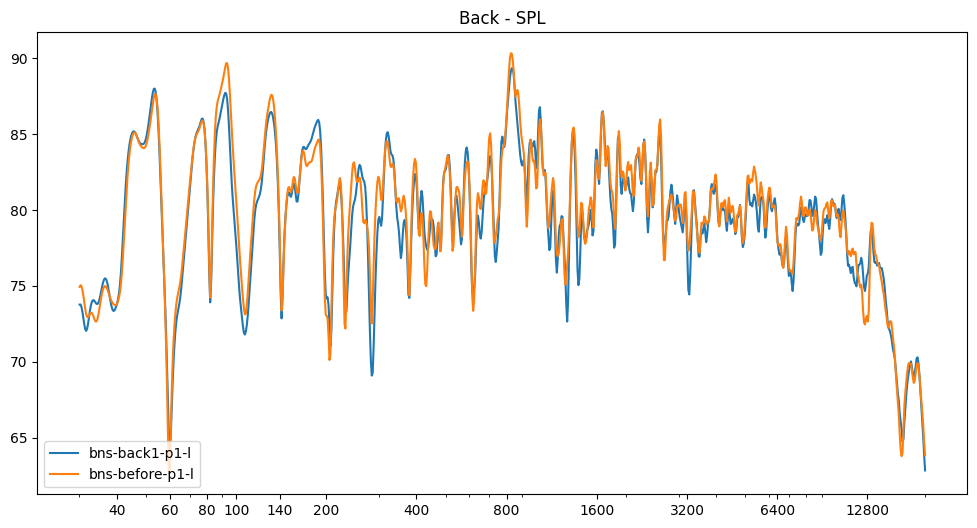

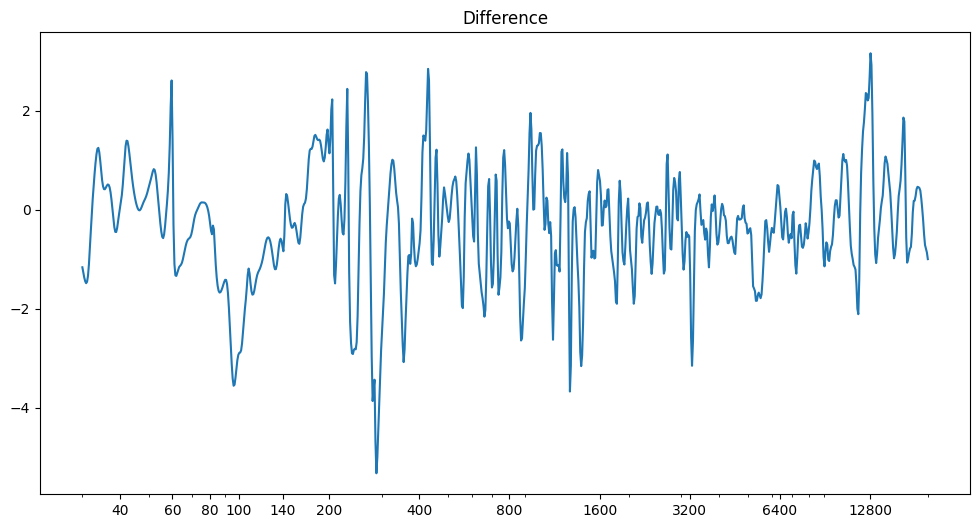

In [9]:
compare_measurements("bns-back1-p1-l", "bns-before-p1-l", "Back")

In [10]:
def compare_topts(a, b, title, dTm=None):
    a_data = rt60s[a]
    b_data = rt60s[b]
    change = np.average(a_data["topt"]) - np.average(b_data["topt"])
    ax1, ax2 = compare(
        a_data["freq"],
        a,
        a_data["topt"],
        b,
        b_data["topt"],
        f"{title}: {change*1000:.0f}ms",
    )
    ax1.set_ylabel("secs")

    if dTm is not None:
        ax2.plot(a_data["freq"], dTm / -1000.0, label="Predicted", color="green")
        ax2.legend(loc="lower left")
    ax2.set_ylabel("secs")
    ax2.axhline(0, color="black")


def per_channel_topts(a, b):
    print(f"topt({b}) topt({a}) change")
    for ch in ("l", "r", "c"):
        a_avg = np.average(rt60s[f"{a}-{ch}"]["topt"])
        b_avg = np.average(rt60s[f"{b}-{ch}"]["topt"])
        change = a_avg - b_avg
        print(f"{ch:3s} {b_avg*1000:.0f}ms {a_avg*1000:.0f}ms {change*1000:.0f}ms")

The model calculated an 18ms reduction for this treatment. We saw a 72ms drop for the left channel, and much more modest 16 and 33ms for right and center respective.

In [11]:
per_channel_topts("bns-back1-p1", "bns-before-p1")

topt(bns-before-p1) topt(bns-back1-p1) change
l   381ms 309ms -72ms
r   333ms 317ms -16ms
c   327ms 294ms -33ms


Leff channel decay time saw an average reduction of a whopping 72ms with the impact covering the whole test frequency range, but starting in earnest above 200Hz. RT60 measurements are a bit noisy so the trends are more reliable than specific values at a given frequency. The right channel saw a reduction of 16ms, the center 33ms. 

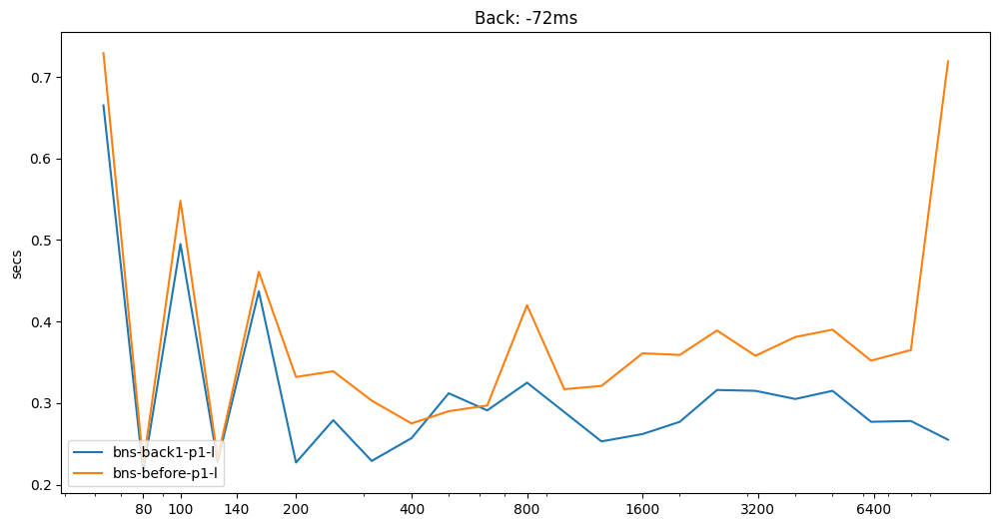

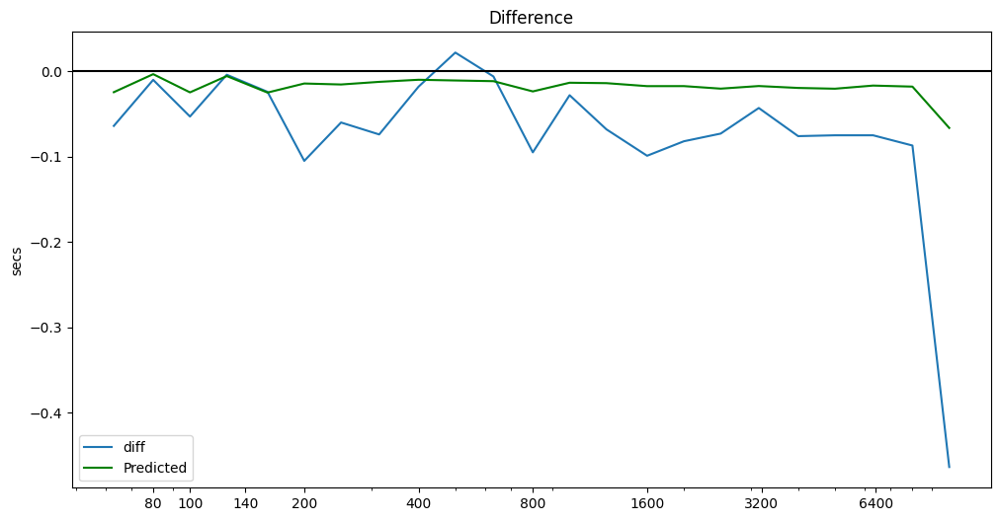

In [12]:
compare_topts(
    "bns-back1-p1-l", "bns-before-p1-l", "Back", dTm=treatments["back"]["dTm"]
)

## Back & Back Slim

The slim absorber between the doors on the back wall was added. It is a very small and fairly thin treatment.

The model predicts an 6ms reduction for this absorber. We actually measure almost 2x that.

In [13]:
per_channel_topts("bns-back12-p1", "bns-before-p1")

topt(bns-before-p1) topt(bns-back12-p1) change
l   381ms 297ms -84ms
r   333ms 305ms -27ms
c   327ms 280ms -47ms


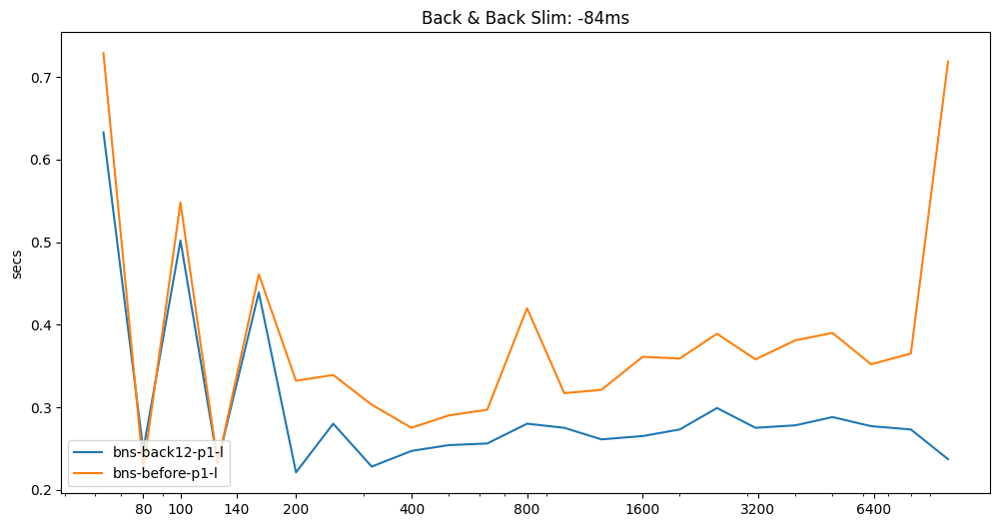

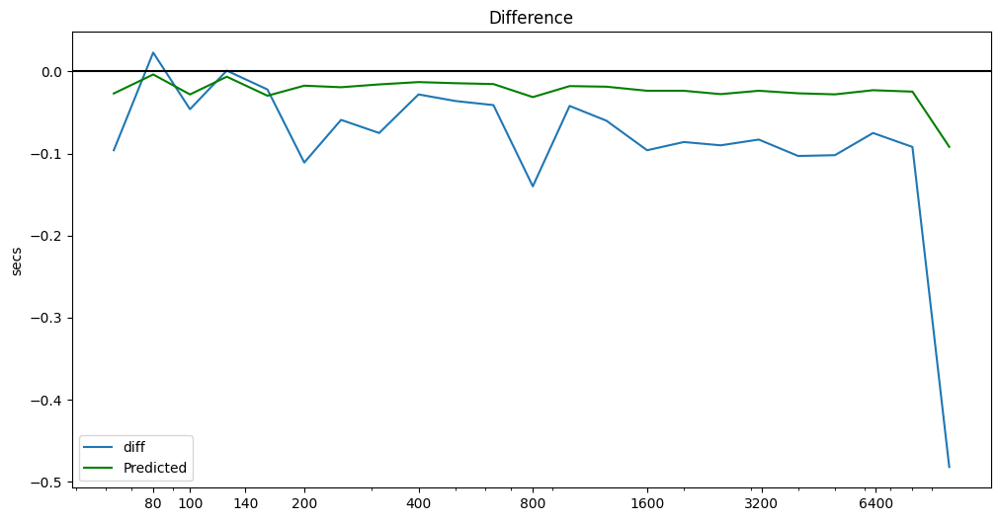

In [14]:
compare_topts(
    "bns-back12-p1-l",
    "bns-before-p1-l",
    "Back & Back Slim",
    dTm=treatments["back"]["dTm"] + treatments["slim"]["dTm"],
)

## Back, Back Slim & Side 2

One of the two side absorbers were hung. The model predicts around an 11ms reduction for it. That's roughly what we see for the left channel, but right and center see a larger drop.

In [15]:
per_channel_topts("bns-back12-side2-p1", "bns-before-p1")

topt(bns-before-p1) topt(bns-back12-side2-p1) change
l   381ms 288ms -93ms
r   333ms 294ms -39ms
c   327ms 257ms -70ms


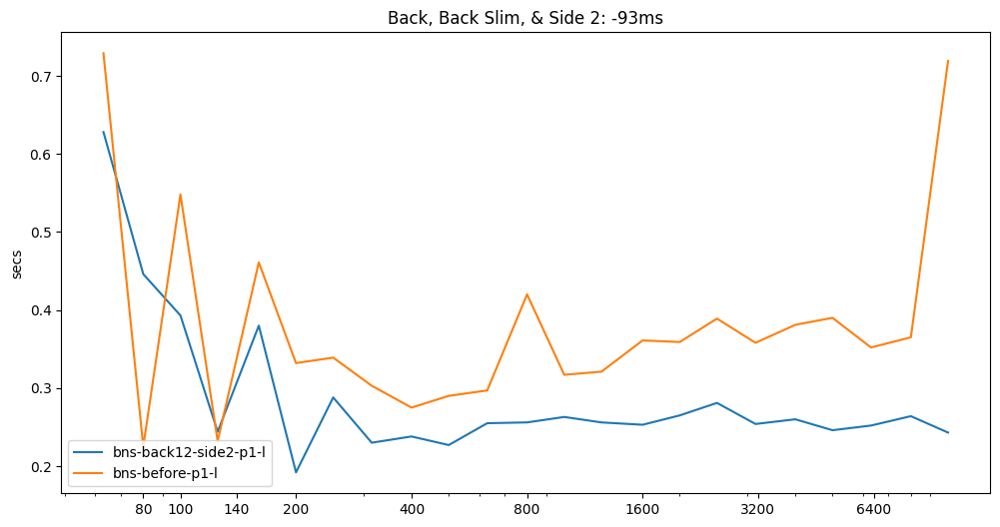

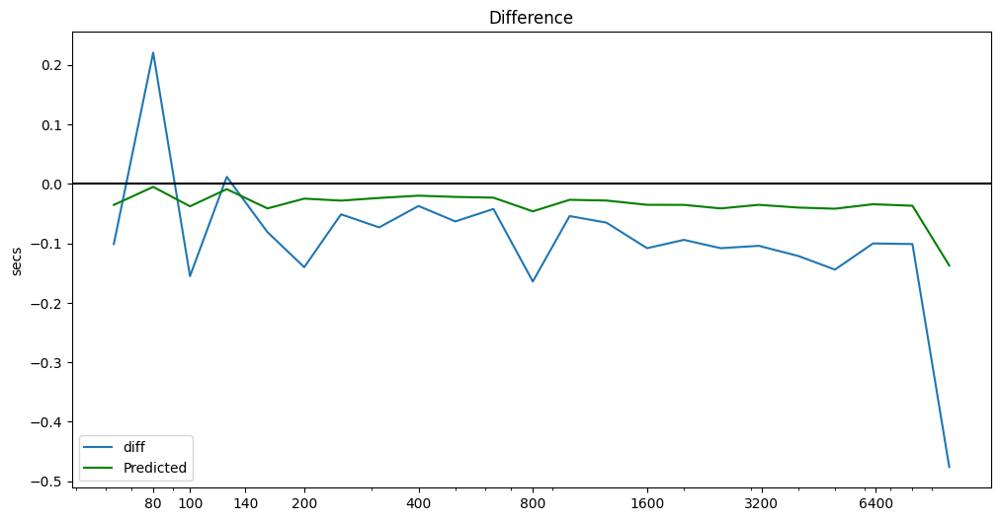

In [16]:
compare_topts(
    "bns-back12-side2-p1-l",
    "bns-before-p1-l",
    "Back, Back Slim, & Side 2",
    dTm=treatments["back"]["dTm"]
    + treatments["slim"]["dTm"]
    + treatments["side"]["dTm"],
)

## Back, Back Slim, & Side 1/2

The final treatment was added to the side wall, idential to the one placed previously.

Bringing back the SPL chart now that we've now completed the absorption install. There's a sizeable dip in responsse from around 80Hz up. This round o treatments didn't have as large an impact on the 100Hz room mode as the fronts.

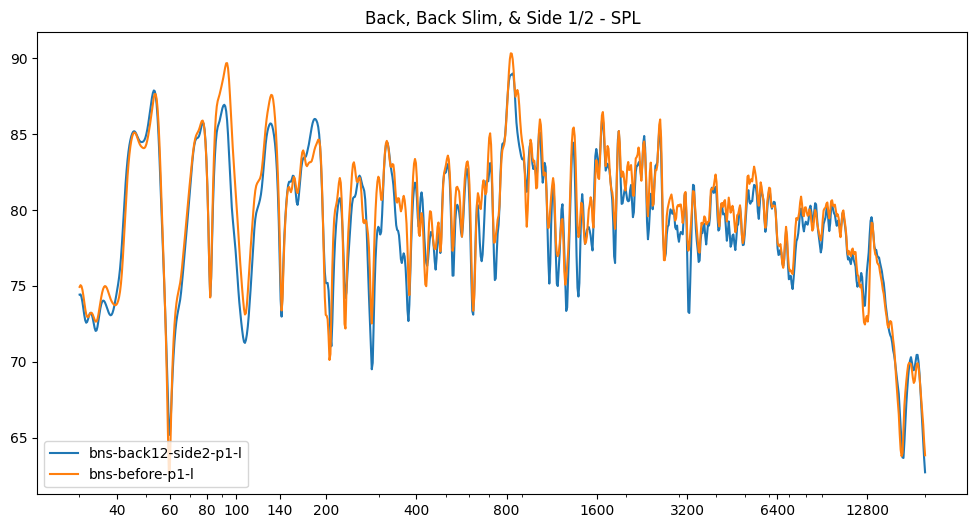

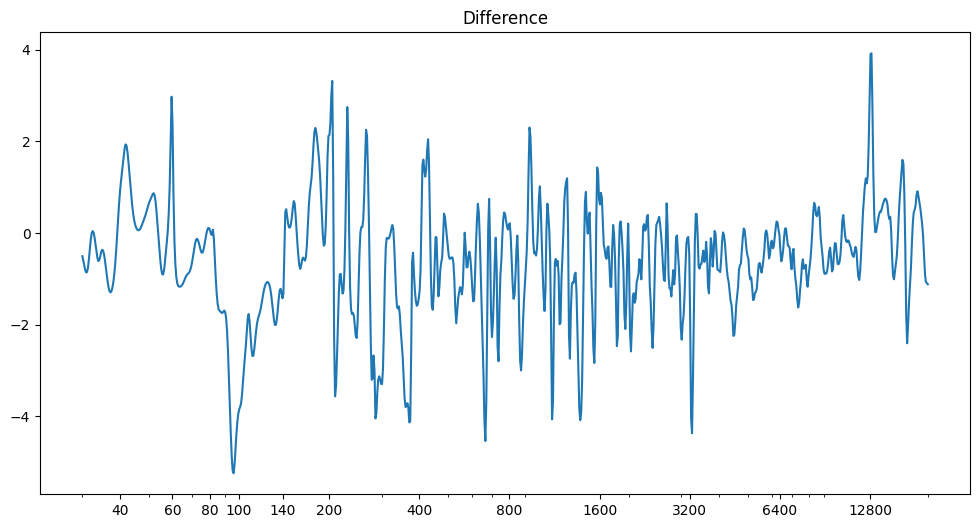

In [17]:
compare_measurements(
    "bns-back12-side2-p1-l", "bns-before-p1-l", "Back, Back Slim, & Side 1/2"
)

We're now at the expected full absorption install on the walls and expecting an 46ms drop in Tm, and we actually get nearly 3x that for the left channel, the side where most of these absorbers were installed. The model was roughly accurate for the right channel and the center saw a 50% additional drop.

More importantly we're actually now approaching the ideal Tm for the room and we actually still have the cloud treatment to build and install to cover the ceiling first reflections and add some diffussion along with the empty cells in the front treatments. It is expected that once that has been install we'd actually be well below the desired Tm so a bit of an adjustment has been made to the plan as a result. 

The large back absorber will be removed and in its place a large set of shelves are going to be installed. The plan is to place some aborptive and/or difussive objects (boxes) on the shelves and below them on the floor including the potential of helmhotlz and/or perforated panel devices. They will also contant decorative items. Details TBD, but the intention is to have a nice looking piece of custom furniture against that back wall into the corner and have enough "stuff" on them to avoid the large flat reflective surfrace. These shelves will actually be deeper than the back absorber.

In [18]:
per_channel_topts("bns-back12-side12-p1", "bns-before-p1")

topt(bns-before-p1) topt(bns-back12-side12-p1) change
l   381ms 269ms -112ms
r   333ms 292ms -40ms
c   327ms 267ms -60ms


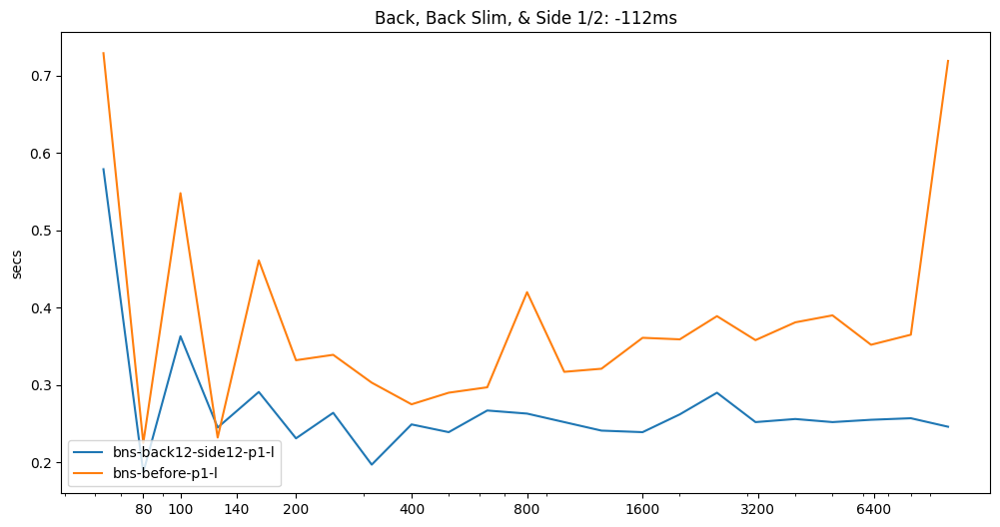

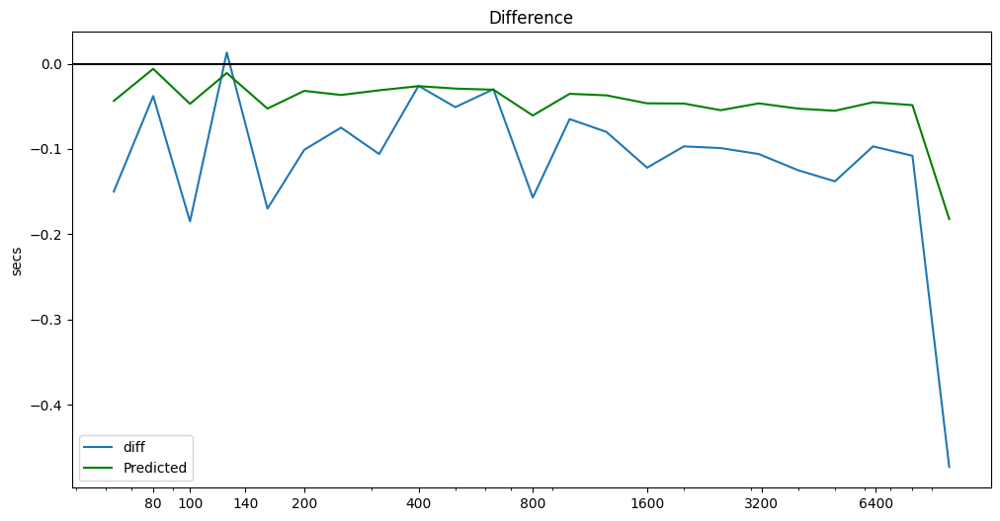

In [19]:
compare_topts(
    "bns-back12-side12-p1-l",
    "bns-before-p1-l",
    "Back, Back Slim, & Side 1/2",
    dTm=treatments["back"]["dTm"]
    + treatments["slim"]["dTm"]
    + (2 * treatments["side"]["dTm"]),
)

### Impulse Responses

For the most part there's only one notable change in the impulse response through the additions of these treatments and it comes when the first one, Back, was installed. There's a reduction around 30ms out which would be around 11m of extra travel time. This may have been a reflection off of the back wall and front wall returning to the measurement position.

There are other smaller reduction. No clear paths to point to though.

In [20]:
def compare_ir(a, b, title, tmax=1.0):
    a_data = impulse_responses[a]["data"][impulse_responses[a]["start"] :]
    b_data = impulse_responses[b]["data"][impulse_responses[b]["start"] :]
    ax = compare_impulse_responses(rate, a, a_data, b, b_data, title, tmax=tmax)

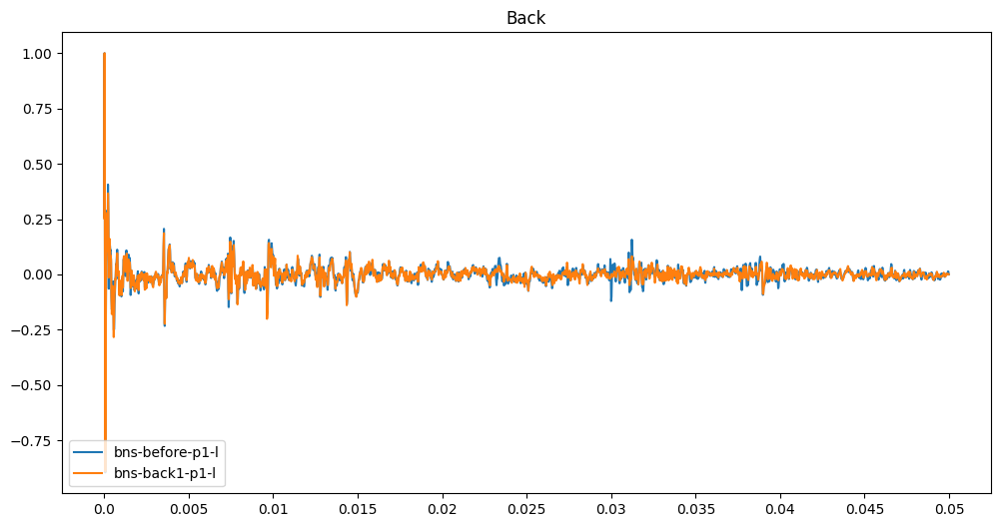

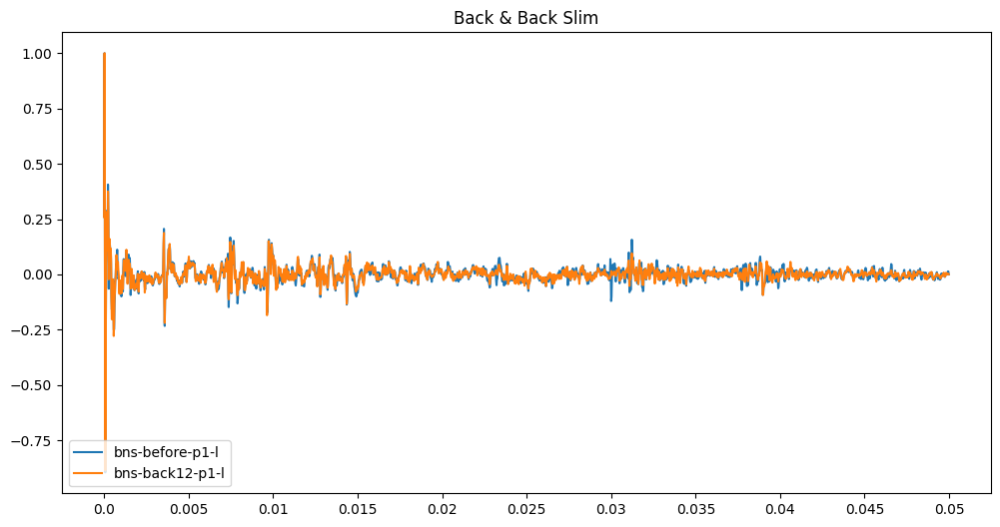

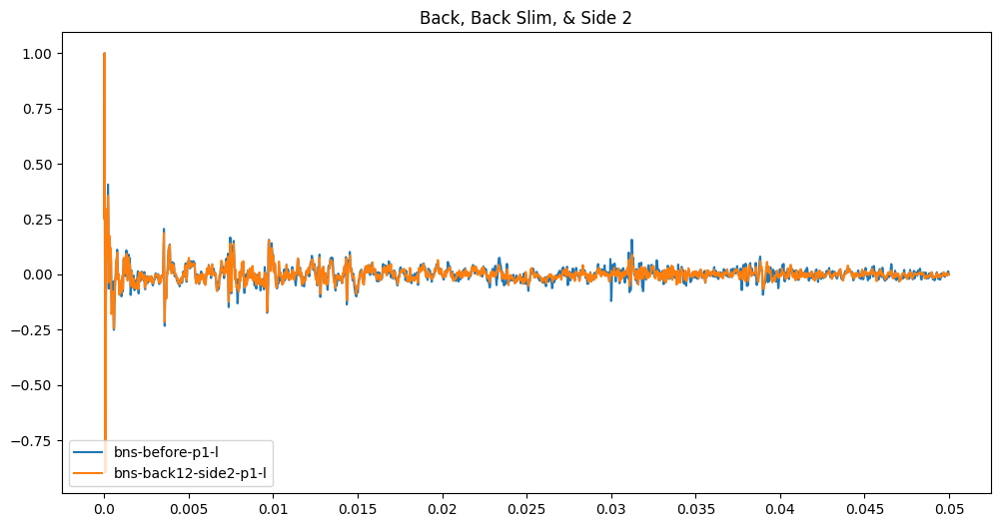

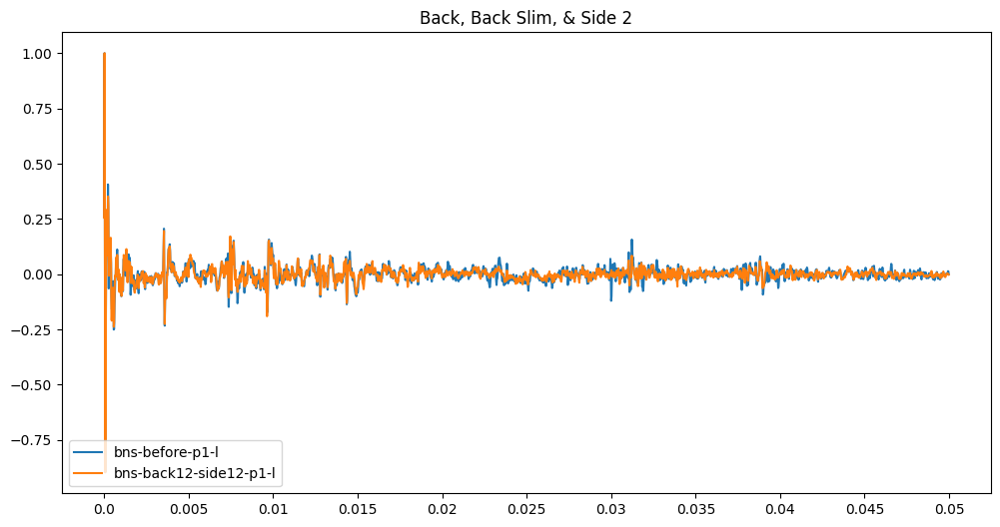

In [21]:
compare_ir("bns-before-p1-l", "bns-back1-p1-l", "Back", tmax=0.05)
compare_ir("bns-before-p1-l", "bns-back12-p1-l", "Back & Back Slim", tmax=0.05)
compare_ir(
    "bns-before-p1-l", "bns-back12-side2-p1-l", "Back, Back Slim, & Side 2", tmax=0.05
)
compare_ir(
    "bns-before-p1-l", "bns-back12-side12-p1-l", "Back, Back Slim, & Side 2", tmax=0.05
)

The results for the right channel are largely the same as treatments are added, we'll just look at the final measurement with all 4 treatments.

There's a number of peak reductions here starting at 7ms and continuing through 15ms, that's roughly 2.5m to 5m. Probably a general reduction of the right channel's bouncing around in the back left corner of the room and (eventually) returning to the measurement position.

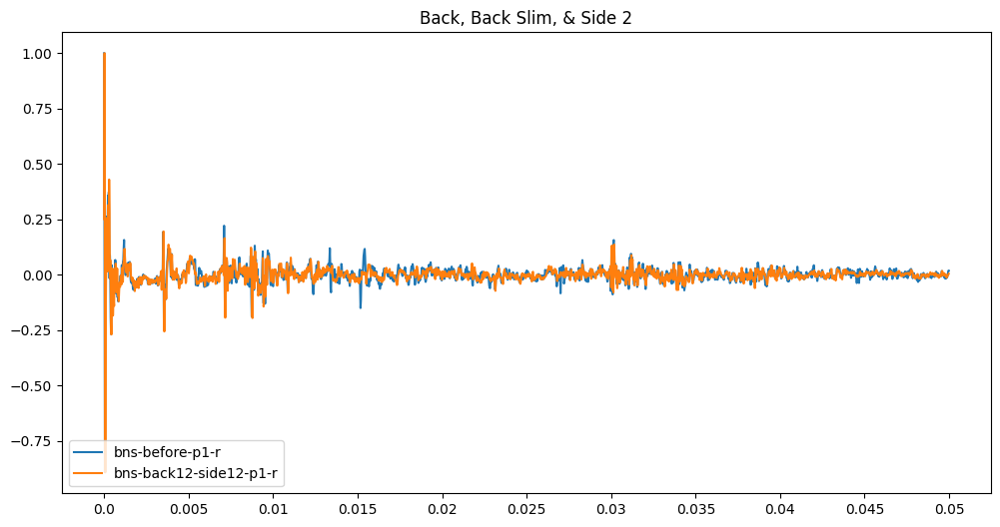

In [22]:
compare_ir(
    "bns-before-p1-r", "bns-back12-side12-p1-r", "Back, Back Slim, & Side 2", tmax=0.05
)

# Listening Simulations.

We'll compare the room without treatments, from the before in the front-treatments notebook, to the before from this notebook, and finally to the after with all the front and back/side treatments placed.

The diference should be fairly apparent, especially comparing the first and last.

In [23]:
convolve_display(
    sample_data, sample_rate, impulse_responses["front-frames-p1-l"]["data"]
)

In [24]:
convolve_display(sample_data, sample_rate, impulse_responses["bns-before-p1-l"]["data"])

In [25]:
convolve_display(
    sample_data, sample_rate, impulse_responses["bns-back12-side12-p1-l"]["data"]
)